# REGCOIL-Like Coil Optimization in DESC

This notebook will show how to use DESC's REGCOIL implementation to find coils using the surface current optimization method, based off of [1]. We will find a coilset for the precise QA equilibrium by first finding a constant offset winding surface, then running the REGCOIL algorithm in two different ways to obtain the surface current which minimizes the quadratic flux on the plasma surface, and finally cutting that surface current into coils and checking the normal field error and field line tracing from that coilset to confirm the equilibrium surfaces are retained with the real coil field.

## REGCOIL Algorithm

The REGCOIL algorithm solves the following minimization problem

Follows algorithm of [1]_ to find the current potential Phi on the surface, given a surface current $\mathbf{K}$ from a surface current potential $\Phi$ on a winding surface:
$$\mathbf{K} =\mathbf{n} \times  \nabla \Phi $$
$$\Phi(\theta',\zeta') = \Phi_{sv}(\theta',\zeta') + \frac{G\zeta'}{2\pi} + \frac{I\theta'}{2\pi}$$
where the single valued part is given as a double Fourier series in the poloidal and toroidal angles:

$$\Phi_{SV}(\theta,\zeta) = \sum_{m,n} \Phi_{SV}^{mn} \mathcal{G}^{m}_{n}(\theta,\zeta)$$

where

$$
   \mathcal{G}^{m}_{n}(\theta,\zeta) = \begin{cases}
   \cos(|m|\theta)\cos(|n|N_{FP}\zeta) &\text{for }m\ge0, n\ge0 \\[.2cm]
   \cos(|m|\theta)\sin(|n|N_{FP}\zeta) &\text{for }m\ge0, n<0 \\[.2cm]
   \sin(|m|\theta)\cos(|n|N_{FP}\zeta) &\text{for }m<0, n\ge0 \\[.2cm]
   \sin(|m|\theta)\sin(|n|N_{FP}\zeta) &\text{for }m<0, n<0.
   \end{cases}
$$


The algorithm minimizes the quadratic flux on the plasma surface due to the
surface current and external fields:

$$\min_{\Phi_{SV}^{mn}} ~\chi^2_B + \lambda_{regularization} \chi^2_K$$

where $\mathbf{B}\cdot\mathbf{n} = B_n$ and $\mathbf{n}$ is the unit surface normal on the plasma surface $S_{plasma}$, while 

$$\chi^2_B = \int_{S_{plasma}} (B_n)^2 dA$$

is the quadratic flux on the plasma boundary from the total magnetic field:

$$B_n = B_n^{SV}\{\Phi_{SV}\} + B_n^{GI} +B_n^{plasma} + B_n^{ext}$$

where the individual contributions to the normal field are the field from the single-valued surface current potential $B_n^{SV}$, the field from the secular part of the surface current potential $B_n^{GI}$, the field from the plasma currents $B_n^{plasma}$ and then any external fields $B_n^{ext}$ (e.g. a TF coilset or other coilset besides the winding surface). $G$ is fixed by the equilibrium magnetic field strength, and $I$ is determined by the desired coil topology (given by the `current_helicity` tuple in the `run_regcoil` method below), with `current_helicity = (M_coil, N_coil)`. If `M_coil` is nonzero and `N_coil` is zero, it corresponds to modular coils, and non-zero `M_coil` and `N_coil` corresponds to helical coils, according to the formula $I = \frac{N_{coil}*G}{ M_{coil}}$. `M_coil` is the number of times the coil transits poloidally around the plasma before returning to itself, while `N_coil` is the number of times the coil transits toroidally before returning to itself. The problem is regularized by the addition of a regularization parameter $\lambda_{regularization}$ multiplying the surface current magnitude integrated over the winding surface $S_{winding}$:

$$\chi^2_K = \int_{S_{winding}} |\mathbf{K}|^2 dA'$$

Smaller $\lambda_{regularization}$ corresponds to no regularization (consequently, lower $B_n$ error but more complex and large surface currents) and larger $\lambda_{regularization}$ corresponds to more regularization (consequently, higher  $B_n$ error but simpler and smaller surface currents), which we will show shortly in this notebook.

[1] Landreman, An improved current potential method for fast computation of stellarator coil shapes, Nuclear Fusion (2017)

If you have access to a GPU, uncomment the following two lines before any DESC or JAX related imports. You should see about an order of magnitude speed improvement with only these two lines of code!

In [ ]:
# from desc import set_device
# set_device("gpu")

As mentioned in [DESC Documentation on performance tips](https://desc-docs.readthedocs.io/en/latest/performance_tips.html), one can use compilation cache directory to reduce the compilation overhead time. Note: One needs to create `jax-caches` folder manually.

In [ ]:
# import jax

# jax.config.update("jax_compilation_cache_dir", "../jax-caches")
# jax.config.update("jax_persistent_cache_min_entry_size_bytes", -1)
# jax.config.update("jax_persistent_cache_min_compile_time_secs", 0)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.grid import LinearGrid
from desc.io import load
from desc.objectives import (
    FixParameters,
    ObjectiveFunction,
    QuadraticFlux,
    SurfaceCurrentRegularization,
)
from desc.optimize import Optimizer
from scipy.constants import mu_0
from desc.magnetic_fields import (
    FourierCurrentPotentialField,
    solve_regularized_surface_current,
)

from desc.examples import get
from desc.plotting import (
    plot_comparison,
    plot_surfaces,
    plot_3d,
    plot_coils,
    plot_2d,
    poincare_plot,
)
import plotly.express as px
import plotly.io as pio

# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
pio.renderers.default = "plotly_mimetype+notebook"

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


DESC version 0.13.0+702.ge6b8a02dc,using JAX backend, jax version=0.4.33, jaxlib version=0.4.33, dtype=float64
Using device: CPU, with 53.74 GB available memory


In [2]:
# define utility function
def plot_field_lines(field, eq):
    # for starting locations we'll pick positions on flux surfaces on the outboard midplane
    grid_trace = LinearGrid(rho=np.linspace(0, 1, 9))
    r0 = eq.compute("R", grid=grid_trace)["R"]
    z0 = eq.compute("Z", grid=grid_trace)["Z"]
    fig, ax = plot_surfaces(eq)
    fig, ax = poincare_plot(
        field,
        r0,
        z0,
        NFP=eq.NFP,
        ax=ax,
        color="k",
        size=1,
    )
    return fig, ax


# plotting utility functions
def plot_regcoil_outputs(
    field,
    data,
    eq,
    eval_grid=None,
    source_grid=None,
    return_data=False,
    vacuum=False,
    **kwargs,
):
    try:
        # if it is a list, just grab the first one
        # as we change the attribute anyways so just need the correct
        # geometry
        field = field[0]
    except TypeError:
        # it was not a list, so proceed as usual
        pass
    cmap = kwargs.pop("cmap", "viridis")
    field = (
        field.copy()
    )  # copy the field so that we are not changing the passed-in field
    scan = len(data["Phi_mn"]) > 1
    scan_str = "_scan" if scan else ""

    lambdas = data["lambda_regularization"]
    chi2Bs = data["chi^2_B"]
    chi2Ks = data["chi^2_K"]
    phi_mns = data["Phi_mn"]
    if eval_grid is None:
        eval_grid = data["eval_grid"]
        eval_grid = (
            eval_grid
            if (not eval_grid.sym and eval_grid.N != 0)
            else LinearGrid(
                M=eval_grid.M,
                N=max(eval_grid.N, 1),
                sym=False,
                NFP=eval_grid.NFP,
                endpoint=True,
            )
        )
    if source_grid is None:
        source_grid = data["source_grid"]

    # check if we can use existing quantities in data
    # or re-evaluate based off of the new grids passed-in
    recalc_eval_grid_quantites = not eval_grid.equiv(
        data["eval_grid"]
    ) or not source_grid.equiv(data["source_grid"])

    if "external_field" in data.keys() and recalc_eval_grid_quantites:
        external_field = data["external_field"]
    else:
        external_field = None

    ncontours = kwargs.pop("ncontours", 15)
    markersize = kwargs.pop("markersize", None)
    xlabel_fontsize = kwargs.pop("xlabel_fontsize", None)
    ylabel_fontsize = kwargs.pop("ylabel_fontsize", None)
    title_fontsize = kwargs.pop("title_fontsize", None)

    figdata = {}
    axdata = {}
    # show composite scan over lambda_regularization plots
    # strongly based off of Landreman's REGCOIL plotting routine:
    # github.com/landreman/regcoil/blob/master/
    figsize = kwargs.pop("figsize", (6, 4))
    figsize2 = (2 * figsize[0], 2 * figsize[1])
    if scan:  # this plot only makes sense for a scan
        fig_chiB_lam, ax_chiB_lam = plt.subplots(figsize=figsize)
        ax_chiB_lam.tick_params(axis="both", which="major", labelsize=ylabel_fontsize)
        ax_chiB_lam.tick_params(axis="both", which="minor", labelsize=ylabel_fontsize)
        ax_chiB_lam.scatter(lambdas, chi2Bs, s=markersize)
        ax_chiB_lam.set_xlabel(
            r"$\lambda$ (regularization parameter)", fontsize=xlabel_fontsize
        )
        ax_chiB_lam.set_ylabel(
            r"$\chi^2_B = \int \int B_{normal}^2 dA$ ", fontsize=ylabel_fontsize
        )
        ax_chiB_lam.set_yscale("log")
        ax_chiB_lam.set_xscale("log")
        figdata["fig_chi^2_B_vs_lambda_regularization"] = fig_chiB_lam
        axdata["ax_chi^2_B_vs_lambda_regularization"] = ax_chiB_lam
        fig_chiK_lam, ax_chiK_lam = plt.subplots(figsize=figsize)
        ax_chiK_lam.tick_params(axis="both", which="major", labelsize=ylabel_fontsize)
        ax_chiK_lam.tick_params(axis="both", which="minor", labelsize=ylabel_fontsize)
        ax_chiK_lam.scatter(lambdas, chi2Ks, s=markersize)
        ax_chiK_lam.set_ylabel(
            r"$\chi^2_K = \int \int K^2 dA'$ ", fontsize=ylabel_fontsize
        )
        ax_chiK_lam.set_xlabel(
            r"$\lambda$ (regularization parameter)", fontsize=xlabel_fontsize
        )
        ax_chiK_lam.set_yscale("log")
        ax_chiK_lam.set_xscale("log")
        figdata["fig_chi^2_K_vs_lambda_regularization"] = fig_chiK_lam
        axdata["ax_chi^2_K_vs_lambda_regularization"] = ax_chiK_lam

        fig_chiB_chiK, ax_chiB_chiK = plt.subplots(figsize=figsize)
        ax_chiB_chiK.tick_params(axis="both", which="major", labelsize=ylabel_fontsize)
        ax_chiB_chiK.tick_params(axis="both", which="minor", labelsize=ylabel_fontsize)
        ax_chiB_chiK.scatter(chi2Ks, chi2Bs, s=markersize)
        ax_chiB_chiK.set_xlabel(
            r"$\chi^2_K = \int \int K^2 dA'$ ", fontsize=xlabel_fontsize
        )
        ax_chiB_chiK.set_ylabel(
            r"$\chi^2_B = \int \int B_{normal}^2 dA$ ", fontsize=ylabel_fontsize
        )
        ax_chiB_chiK.set_yscale("log")
        ax_chiB_chiK.set_xscale("log")
        figdata["fig_chi^2_B_vs_chi^2_K"] = fig_chiB_chiK
        axdata["ax_chi^2_B_vs_chi^2_K"] = ax_chiB_chiK

    nlam = len(chi2Bs)
    max_nlam_for_contour_plots = 16
    numPlots = min(nlam, max_nlam_for_contour_plots)
    ilam_to_plot = np.sort(list(set(map(int, np.linspace(1, nlam, numPlots)))))
    numPlots = len(ilam_to_plot)

    numCols = int(np.ceil(np.sqrt(numPlots)))
    numRows = int(np.ceil(numPlots * 1.0 / numCols))

    ########################################################
    # Plot total current potentials
    ########################################################
    fig_Phi, ax_Phi = plt.subplots(nrows=numRows, ncols=numCols, figsize=figsize2)
    whichPlot = 0
    for row in range(numRows):
        for col in range(numCols):
            ax = ax_Phi if not scan else ax_Phi[row, col]
            phi_mn_opt = phi_mns[ilam_to_plot[whichPlot] - 1]
            field.Phi_mn = phi_mn_opt
            field.I = data["I"]
            field.G = data["G"]
            _, ax = plot_2d(
                field,
                "Phi",
                grid=source_grid,
                ax=ax,
                cmap=cmap,
                filled=False,
                levels=ncontours,
                title_fontsize=title_fontsize,
                xlabel_fontsize=xlabel_fontsize,
                ylabel_fontsize=ylabel_fontsize,
            )

            ax.set_title(
                r"$\lambda =$"
                + f" {lambdas[ilam_to_plot[whichPlot] - 1]:1.5e}"
                + f" index = {ilam_to_plot[whichPlot]-1}",
                # fontsize="small",
            )
            whichPlot += 1
    fig_Phi.tight_layout()
    fig_Phi.subplots_adjust(top=0.92)

    fig_Phi.suptitle(
        r"Total Current Potential $\Phi$ (A)",
        fontsize=title_fontsize,
    )
    figdata["fig" + scan_str + "_Phi"] = fig_Phi
    axdata["ax" + scan_str + "_Phi"] = ax_Phi

    ########################################################
    # Plot Bn
    ########################################################
    fig_Bn, ax_Bn = plt.subplots(nrows=numRows, ncols=numCols, figsize=figsize2)
    whichPlot = 0
    for row in range(numRows):
        for col in range(numCols):
            ax = ax_Bn if not scan else ax_Bn[row, col]
            phi_mn_opt = phi_mns[ilam_to_plot[whichPlot] - 1]
            field.Phi_mn = phi_mn_opt
            field.I = data["I"]
            field.G = data["G"]
            _, ax = plot_2d(
                eq if not vacuum else eq.surface,
                "B*n",
                field=(field if external_field is None else field + external_field),
                grid=eval_grid,
                field_grid=source_grid,
                ax=ax,
                cmap=cmap,
                levels=ncontours,
                title_fontsize=title_fontsize,
                xlabel_fontsize=xlabel_fontsize,
                ylabel_fontsize=ylabel_fontsize,
            )

            ax.set_title(
                r"$\lambda =$"
                + f" {lambdas[ilam_to_plot[whichPlot] - 1]:1.5e}"
                + f" index = {ilam_to_plot[whichPlot] - 1}",
                # fontsize="small",
            )
            whichPlot += 1
    fig_Bn.tight_layout()
    fig_Bn.subplots_adjust(top=0.92)
    fig_Bn.suptitle(
        r"$B_n$ (T)",
        fontsize=title_fontsize,
    )
    figdata["fig" + scan_str + "_Bn"] = fig_Bn
    axdata["ax" + scan_str + "_Bn"] = ax_Bn
    ########################################################
    # Plot Surface Current |K|
    ########################################################
    fig_K, ax_K = plt.subplots(nrows=numRows, ncols=numCols, figsize=figsize2)
    whichPlot = 0
    for row in range(numRows):
        for col in range(numCols):
            ax = ax_K if not scan else ax_K[row, col]
            phi_mn_opt = phi_mns[ilam_to_plot[whichPlot] - 1]
            field.Phi_mn = phi_mn_opt
            field.I = data["I"]
            field.G = data["G"]
            _, ax = plot_2d(
                field,
                "K",
                grid=source_grid,
                ax=ax,
                cmap=cmap,
                levels=ncontours,
                title_fontsize=title_fontsize,
                xlabel_fontsize=xlabel_fontsize,
                ylabel_fontsize=ylabel_fontsize,
            )

            ax.set_title(
                r"$\lambda =$"
                + f" {lambdas[ilam_to_plot[whichPlot] - 1]:1.5e}"
                + f" index = {ilam_to_plot[whichPlot] - 1}",
                # fontsize="small",
            )
            whichPlot += 1
    fig_K.tight_layout()
    fig_K.subplots_adjust(top=0.92)
    fig_K.suptitle(
        r"$|K|$ (A/m)",
        fontsize=title_fontsize,
    )
    figdata["fig" + scan_str + "_K"] = fig_K
    axdata["ax" + scan_str + "_K"] = ax_K
    if return_data:
        return (
            figdata,
            axdata,
            data,
        )
    else:
        return figdata, axdata

## Create Constant Offset Surface

We will use the algorithm outlined in the appendix of [1] to create a surface offset from the precise QA equilibrium surface by a constant distance of 0.25 meters. In DESC this is implemented as the `constant_offset_surface` method of `FourierRZToroidalSurface`, which will create a constant offset surface from the surface object it is called with by fitting a surface to points offset along the unit surface normal evaluated at a given grid on the base surface. We can thus use `eq.surface.constant_offset_surface(offset)` to obtain the desired surface.

In [3]:
eq = get("precise_QA")

# create the constant offset surface
surf = eq.surface.constant_offset_surface(
    offset=0.25,  # desired offset
    M=16,  # Poloidal resolution of desired offset surface
    N=16,  # Toroidal resolution of desired offset surface
    grid=LinearGrid(M=32, N=32, NFP=eq.NFP),
)  # grid of points on base surface to evaluate unit normal and find points on offset surface,
# generally should be twice the desired resolution

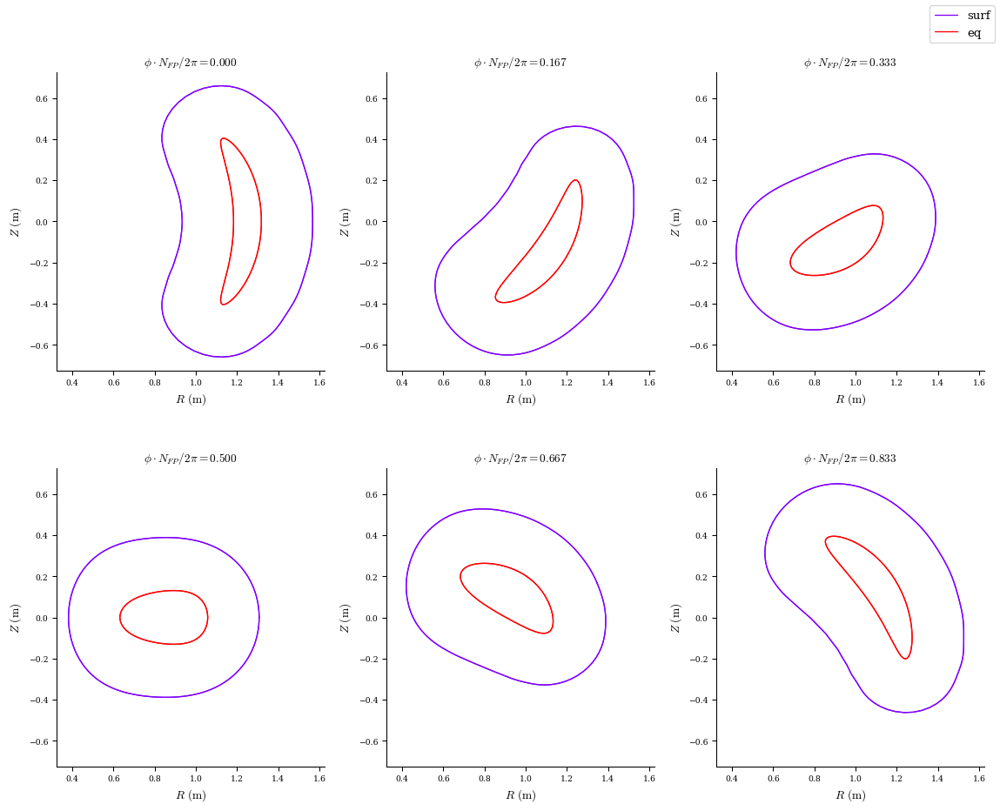

In [4]:
plot_comparison([surf, eq], labels=["surf", "eq"], theta=0, rho=np.array(1.0));

## REGCOIL Algorithm through `SurfaceCurrentField.run_regcoil` Method

To run the REGCOIL algorithm outlined earlier in this notebook, we can use the `FourierCurrentPotentialField` object in DESC, which describes a magnetic field created from a surface current of the form used in REGCOIL:
$$\mathbf{K} =\mathbf{n} \times  \nabla \Phi $$
$$\Phi(\theta',\zeta') = \Phi_{sv}(\theta',\zeta') + \frac{G\zeta'}{2\pi} + \frac{I\theta'}{2\pi}$$

where `FourierCurrentPotentialField.Phi_mn` corresponds to the Fourier coefficients of $\Phi_{sv}$, and `FourierCurrentPotentialField.I` and `FourierCurrentPotentialField.G` correspond to the net toroidal current on the surface $I$ and the net poloidal current on the surface $G$. $G$ is determined by the desired equilibrium field strength, and is manually assigned in this cell for clarity (in practice the `run_regcoil` method will automatically assign `G` according to the equilibrium field strength). We will show both modular $I=0$ and helical $I\neq0$ coils in this notebook.

### Modular

##########################################################
Calculating Phi_SV for lambda_regularization = 0.00000e+00
##########################################################
chi^2 B = 1.05428e-10
min Bnormal = 1.22133e-17 (T)
Max Bnormal = 1.07518e-07 (T)
Avg Bnormal = 1.21751e-08 (T)
min Bnormal = 1.17885e-17 (unitless)
Max Bnormal = 1.03778e-07 (unitless)
Avg Bnormal = 1.17516e-08 (unitless)
##########################################################
Calculating Phi_SV for lambda_regularization = 1.00000e-30
##########################################################
chi^2 B = 1.05428e-10
min Bnormal = 1.19215e-17 (T)
Max Bnormal = 1.07518e-07 (T)
Avg Bnormal = 1.21751e-08 (T)
min Bnormal = 1.15068e-17 (unitless)
Max Bnormal = 1.03778e-07 (unitless)
Avg Bnormal = 1.17516e-08 (unitless)
##########################################################
Calculating Phi_SV for lambda_regularization = 4.28133e-29
##########################################################
chi^2 B = 1.05428e-10
m

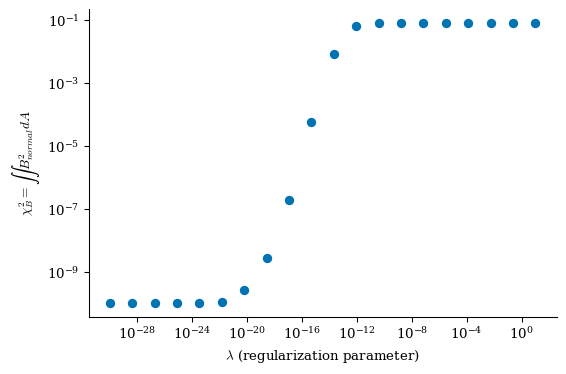

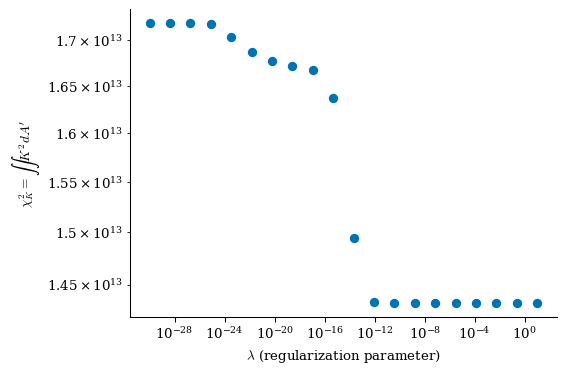

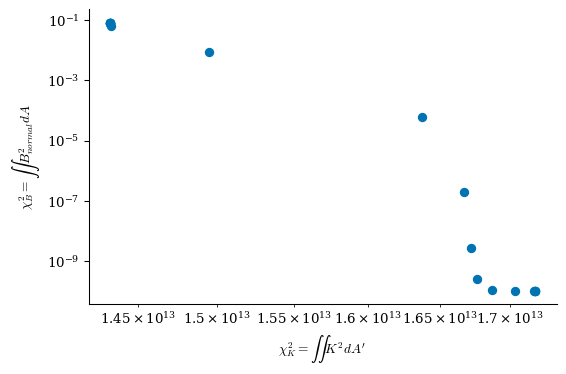

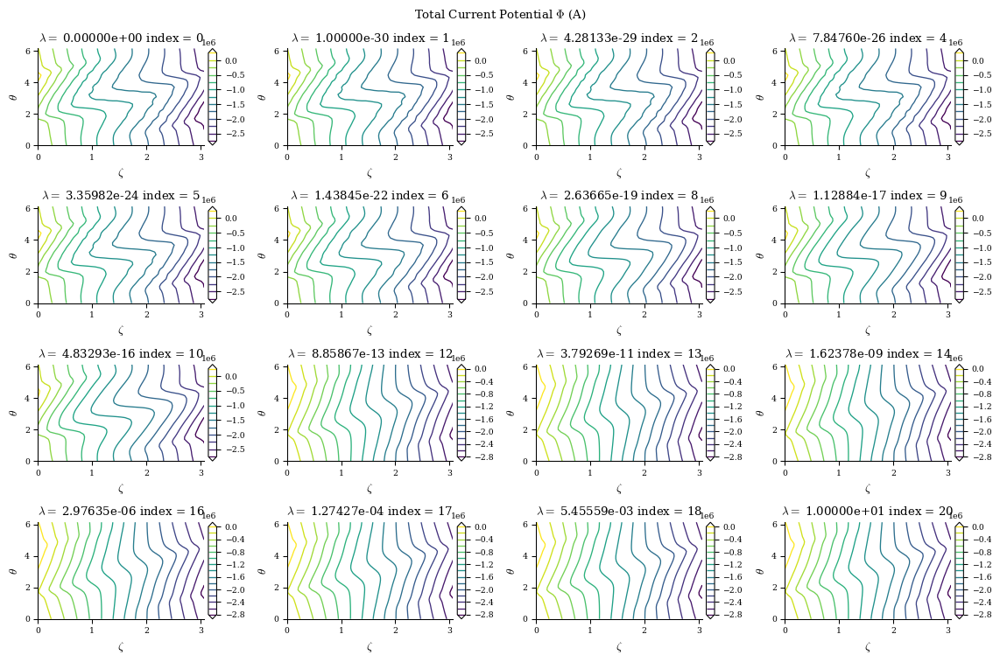

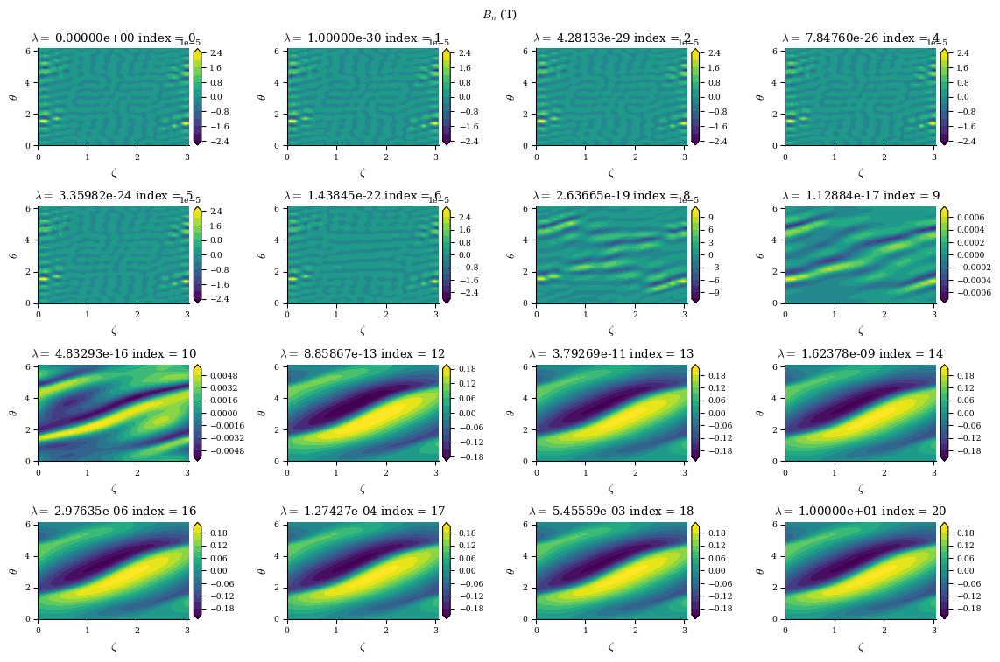

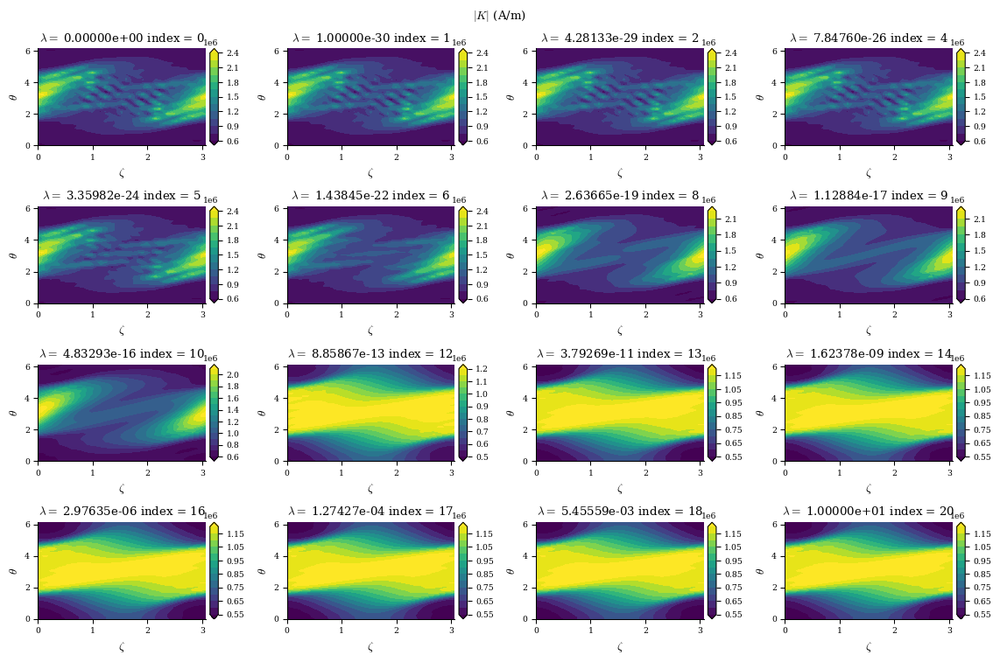

In [5]:
# create the FourierCurrentPotentialField object from the constant offset surface we found in the previous cell
surface_current_field = FourierCurrentPotentialField.from_surface(
    surf,
    I=0,
    # manually setting G to value needed to provide the equilibrium's toroidal flux,
    # though this is not necessary as it gets set automatically inside the solve_regularized_surface_current function
    G=np.asarray(
        [
            -eq.compute("G", grid=LinearGrid(rho=np.array(1.0)))["G"][0]
            / mu_0
            * 2
            * np.pi
        ]
    ),
    # set symmetry of the current potential, "sin" is usually expected for stellarator-symmetric surfaces and equilibria
    sym_Phi="sin",
)

surface_current_field.change_Phi_resolution(M=12, N=12)

# create the evaluation grid (where Bn will be minimized on plasma surface)
# and source grid (discretizes the source K for Biot-Savart and where |K| will be penalized on winding surface)
Megrid = 20
Negrid = 20
Msgrid = 20
Nsgrid = 20

eval_grid = LinearGrid(M=Megrid, N=Negrid, NFP=eq.NFP, sym=False)
# ensure that sym=False for source grid so the field evaluated from the surface current is accurate
# (i.e. must evaluate source over whole surface, not just the symmetric part)
# NFP>1 is ok, as we internally will rotate the source through the field periods to sample entire winding surface
sgrid = LinearGrid(M=Msgrid, N=Nsgrid, NFP=eq.NFP, sym=False)

lambda_regularization = np.append(np.array([0]), np.logspace(-30, 1, 20))

# solve_regularized_surface_current method runs the REGCOIL algorithm
fields, data = solve_regularized_surface_current(
    surface_current_field,  # the surface current field whose geometry and Phi resolution will be used
    eq=eq,  # the Equilibrium object to minimize Bn on the surface of
    source_grid=sgrid,  # source grid
    eval_grid=eval_grid,  # evaluation grid
    current_helicity=(
        1,
        0,
    ),  # pair of integers (M_coil, N_coil), determines topology of contours (almost like  QS helicity),
    #  M_coil is the number of times the coil transits poloidally before closing back on itself
    # and N_coil is the toroidal analog (if M_coil!=0 and N_coil=0, we have modular coils, if both M_coil
    # and N_coil are nonzero, we have helical coils)
    # we pass in an array to perform scan over the regularization parameter (which we call lambda_regularization)
    # to see tradeoff between Bn and current complexity
    lambda_regularization=lambda_regularization,
    # lambda_regularization can also be just a single number in which case no scan is performed
    vacuum=True,  # this is a vacuum equilibrium, so no need to calculate the Bn contribution from the plasma currents
    regularization_type="regcoil",
    chunk_size=40,
)
surface_current_field = fields[
    0
]  # fields is a list of FourierCurrentPotentialField objects
# the plot function can take either the list or a single field, all that matters is it has
# the correct Phi resolution and surface geometry
plot_regcoil_outputs(surface_current_field, data, eq, vacuum=True);

`data` is a dictionary containing the `Phi_mn` arrays for each different value of $\lambda_{regularization}$ (corresponding to the `data["lambda_regularizations"]` item in the dict), as well as other useful information like the net currents $I$ and $G$ and the cost functions $\chi^2_B$ and $\chi^2_K$ at each value of $\lambda_{regularization}$

In [6]:
data.keys()

dict_keys(['eval_grid', 'source_grid', 'lambda_regularization', 'Phi_mn', 'I', 'G', 'chi^2_B', 'chi^2_K', '|K|', 'Bn_total'])

### Helical

##########################################################
Calculating Phi_SV for lambda_regularization = 0.00000e+00
##########################################################
chi^2 B = 1.14452e-07
min Bnormal = 4.74454e-18 (T)
Max Bnormal = 1.89358e-06 (T)
Avg Bnormal = 3.92681e-07 (T)
min Bnormal = 4.57952e-18 (unitless)
Max Bnormal = 1.82772e-06 (unitless)
Avg Bnormal = 3.79023e-07 (unitless)
##########################################################
Calculating Phi_SV for lambda_regularization = 1.00000e-30
##########################################################
chi^2 B = 1.14452e-07
min Bnormal = 5.04463e-18 (T)
Max Bnormal = 1.89358e-06 (T)
Avg Bnormal = 3.92681e-07 (T)
min Bnormal = 4.86917e-18 (unitless)
Max Bnormal = 1.82772e-06 (unitless)
Avg Bnormal = 3.79023e-07 (unitless)
##########################################################
Calculating Phi_SV for lambda_regularization = 4.28133e-29
##########################################################
chi^2 B = 1.14452e-07
m

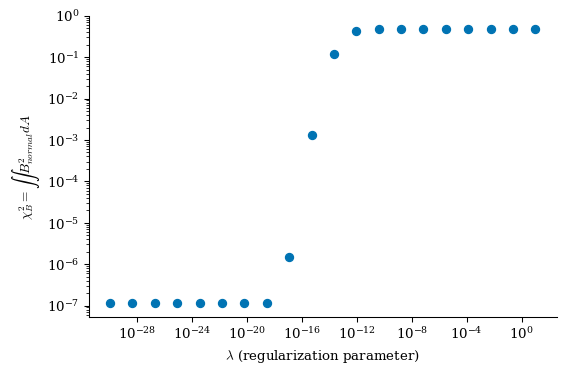

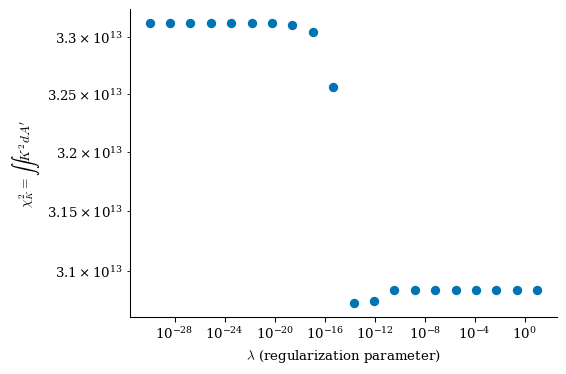

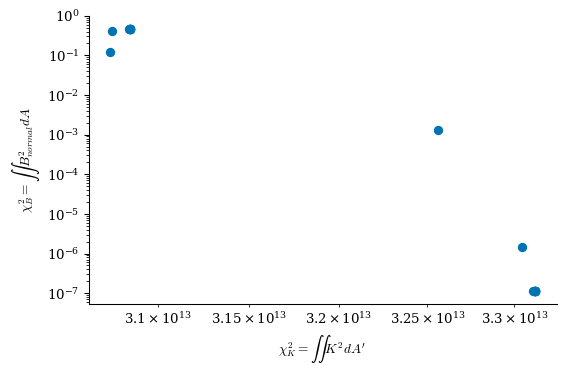

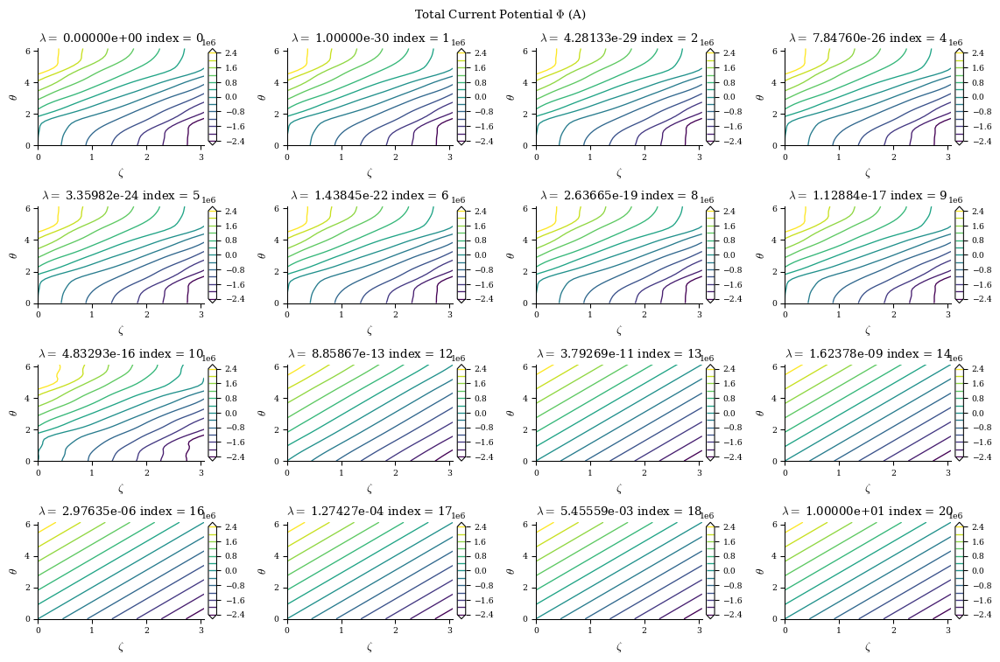

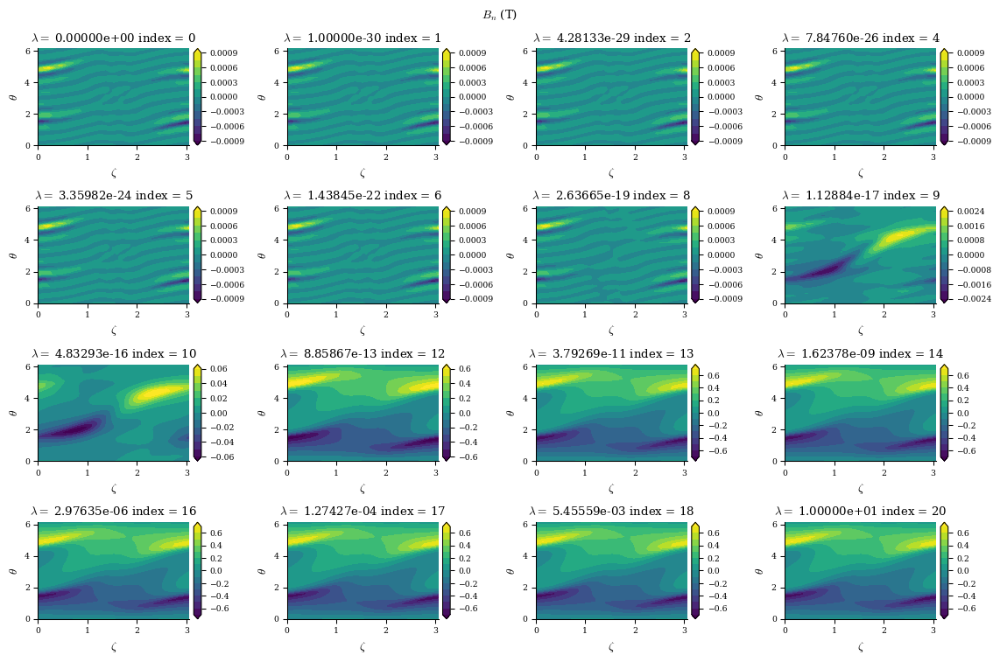

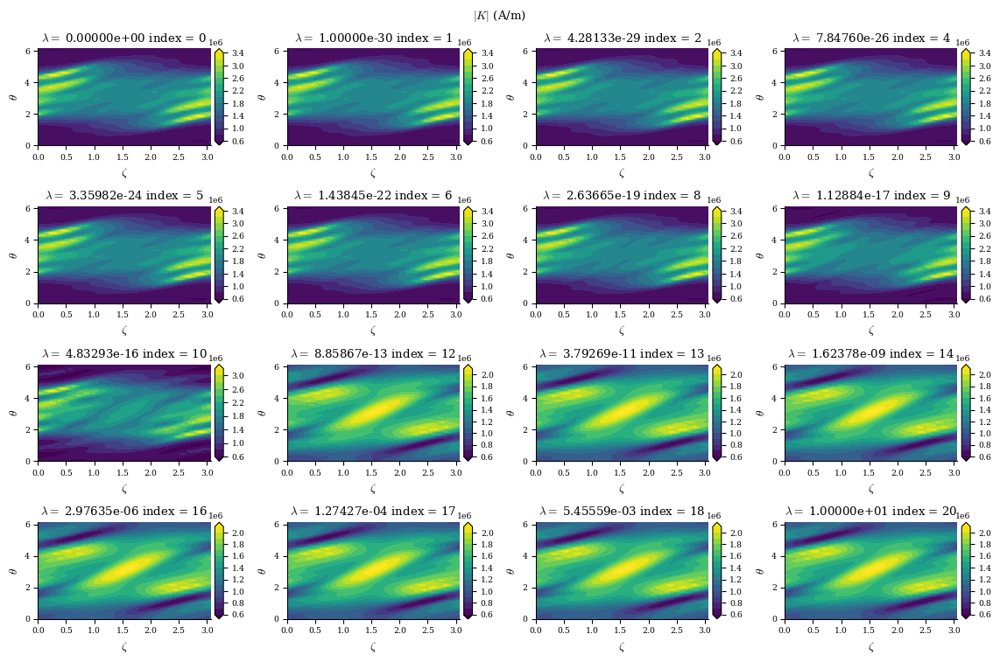

In [7]:
# create the FourierCurrentPotentialField object from the constant offset surface we found in the previous cell
surface_current_field_helical = FourierCurrentPotentialField.from_surface(
    surf,
    I=0,  # this will be overwritten with the `solve_regularized_surface_current` call
    # manually setting G to value needed to provide the equilibrium's toroidal flux
    G=np.asarray(
        [
            -eq.compute("G", grid=LinearGrid(rho=np.array(1.0)))["G"][0]
            / mu_0
            * 2
            * np.pi
        ]
    ),
    # set symmetry of the current potential, "sin" is usually expected for stellarator-symmetric surfaces and equilibria
    sym_Phi="sin",
)
# we use the same grids from the above cells
surface_current_field_helical.change_Phi_resolution(M=8, N=8)

# solve_regularized_surface_current method runs the REGCOIL-like algorithm
fields_helical, data_helical = solve_regularized_surface_current(
    surface_current_field_helical,  # the surface current field whose geometry and Phi resolution will be used
    eq=eq,  # the Equilibrium object to minimize Bn on the surface of
    source_grid=sgrid,  # source grid
    eval_grid=eval_grid,  # evaluation grid
    current_helicity=(
        1 * surface_current_field_helical.NFP,
        -1,
    ),  # pair of integers (M_coil, N_coil), determines topology of contours (almost like  QS helicity),
    #  M_coil is the number of times the coil transits poloidally before closing back on itself (since it is helical now,
    # we want this to be num_turns_per_FP * NFP)  and N_coil is the toroidal analog (if M_coil!=0 and N_coil=0, we have
    # modular coils, if both M_coil and N_coil are nonzero, we have helical coils)
    # # we pass in an array to perform scan over the regularization parameter (which we call lambda_regularization)
    # to see tradeoff between Bn and current complexity
    lambda_regularization=lambda_regularization,
    # lambda_regularization can also be just a single number in which case no scan is performed
    vacuum=True,  # this is a vacuum equilibrium, so no need to calculate the Bn contribution from the plasma currents
    # there are two different regularizations available, "simple" penalizes the Phi_mn current potential components only,
    # which is cheaper than the "regcoil" regularization, with the tradeoff that chi^2_K is not guaranteed to monotonically decrease
    regularization_type="simple",
    chunk_size=40,
)
surface_current_field_helical = fields_helical[0]
plot_regcoil_outputs(surface_current_field_helical, data_helical, eq, vacuum=True);

From both of the above calculations, we can see that there is an optimal tradeoff between complexity and normal field error to be roughly $\lambda_{regularization}=1e-19$, so we will set the `surface_current_field` objects with the corresponding `Phi_mn`

In [8]:
# index 8 corresponds to lambda_regularization=~1e-19
surface_current_field.Phi_mn = data["Phi_mn"][8]
surface_current_field_helical.Phi_mn = data_helical["Phi_mn"][8]

## REGCOIL Algorithm with `QuadraticFlux`  and `SurfaceCurrentRegularization` Objective Functions

Alternatively, we can solve a similar problem using the optimization framework of DESC, by using two objectives, a `QuadraticFlux` objective targeting the normal field errors on the plasma surface from the field, and a `SurfaceCurrentRegularization` objective to add the regularization based off of the surface current magnitude. This is the same problem as is solved above, but in a way that could be combined with other optimization objectives.

In [9]:
# form the constraints for the problem, we only want the Phi_mn to vary so we will fix all other parameters of FourierCurrentPotentialField
constraints = (  # now fix all but Phi_mn
    FixParameters(
        surface_current_field,
        params={"I": True, "G": True, "R_lmn": True, "Z_lmn": True},
    ),
)
# we form the QuadraticFlux part of the objective function
obj_flux = QuadraticFlux(
    field=surface_current_field,  # the field to be optimized
    eq=eq,  # the equilibrium upon which the quadratic flux is being evaluated
    eval_grid=eval_grid,
    field_grid=sgrid,
    vacuum=True,
    bs_chunk_size=10,
)
# the regularization cost based off of the surface current magnitude
obj_regularization = SurfaceCurrentRegularization(
    surface_current_field=surface_current_field,
    source_grid=sgrid,
    weight=np.sqrt(data["lambda_regularization"][8]),
)  # we will set it to the sqrt of optimal weight from above,
# since DESC will square the weight when making the overall cost fxn

optimizer = Optimizer("lsq-exact")

objective = ObjectiveFunction((obj_flux, obj_regularization))
(surface_current_field,), result = optimizer.optimize(
    surface_current_field,
    objective,
    constraints,
    verbose=1,
    ftol=0,
    gtol=0,
    xtol=1e-16,
    # because it is a linear least-squares problem, it is exactly solvable in 1 iteration
    maxiter=1,
    # we must make sure that the trust region of the optimization algorithm is
    # large enough to allow the entire problem to be solved in one step, so set the
    # trust radius to be infinite
    options={
        "initial_trust_radius": np.inf,
        # we also will use the Cholesky factorization to solve
        # since the matrices involved are positive-definite
        "tr_method": "cho",
    },
)

Building objective: Quadratic flux
Precomputing transforms
Building objective: surface-current-regularization
Precomputing transforms
Building objective: fixed parameters
Number of parameters: 312
Number of objectives: 3362

Starting optimization
Using method: lsq-exact


/home/fouriest/SCHOOL/Princeton/PPPL/DESC/desc/optimize/least_squares.py:351: RuntimeWarning:

invalid value encountered in scalar divide



         Current function value: 6.189e-08
         Total delta_x: 6.509e+03
         Iterations: 1
         Function evaluations: 2
         Jacobian evaluations: 2
                                                                 Start  -->   End
Total (sum of squares):                                      1.647e-06  -->   6.189e-08, 
Maximum absolute Boundary normal field error:                3.123e-05  -->   7.865e-06 (T m^2)
Minimum absolute Boundary normal field error:                7.944e-17  -->   2.755e-17 (T m^2)
Average absolute Boundary normal field error:                6.239e-06  -->   1.013e-06 (T m^2)
Maximum absolute Boundary normal field error:                1.703e-04  -->   4.289e-05 (normalized)
Minimum absolute Boundary normal field error:                4.332e-16  -->   1.503e-16 (normalized)
Average absolute Boundary normal field error:                3.402e-05  -->   5.523e-06 (normalized)
Maximum absolute Surface Current Regularization:             1.206e+06 

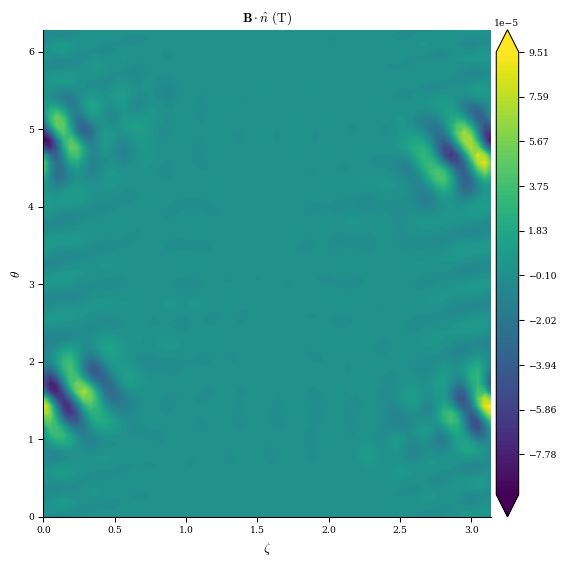

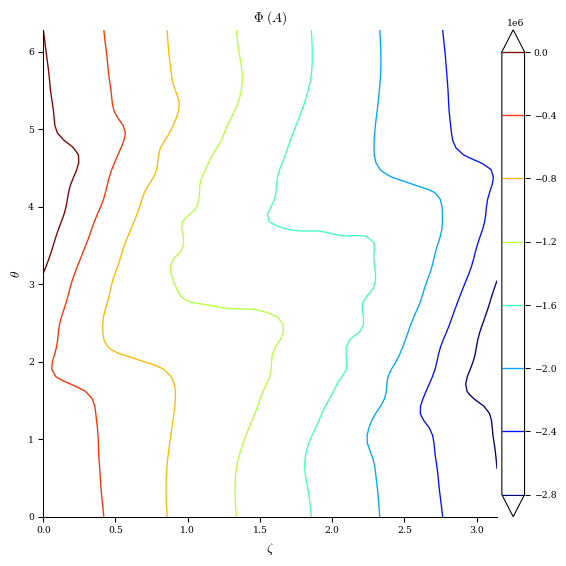

In [10]:
import matplotlib.pyplot as plt

plot_2d(
    eq.surface,
    "B*n",
    field=surface_current_field,
    field_grid=LinearGrid(M=80, N=80, NFP=eq.NFP),
    cmap="viridis",
)

plot_2d(surface_current_field, "Phi", levels=10, filled=False);

## Create Coils from Surface Current

Now that we have the surface current, we can take a selection of constant $\Phi$ contours to discretize the surface current into coils. This can be done easily via the `FourierCurrentPotentialField.to_CoilSet` method, which will take the surface current field and return a discretized coilset with the desired total number of coils `num_coils`.

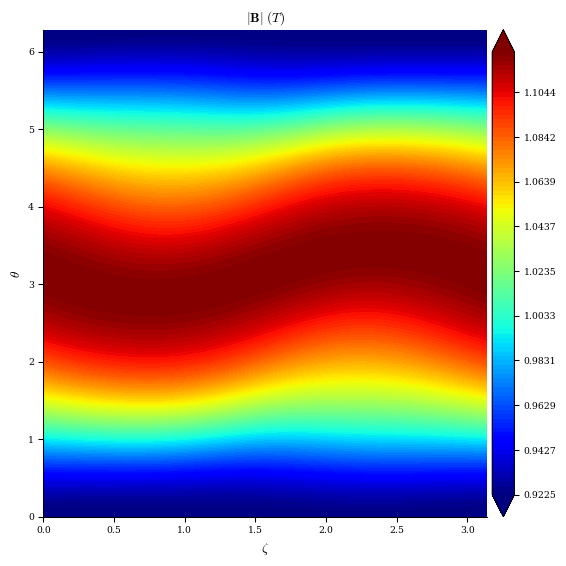

In [11]:
# for reference when we look at B normal errors we will plot the equilibrium magnetic field, it is roughly 1 T
plot_2d(eq, "|B|");

### Modular

In [12]:
coilset = surface_current_field.to_CoilSet(num_coils=6, stell_sym=True)
# num_coils is the number of coils per (half) field period when the surface current helicity's N_coil is zero (half period if stell_sym=True), so we
# will get 6*2*NFP = 24 coils total

We can compute the normal field error with the coilset now, we see it has increased from before since there is some discretization error from representing the continuous surface current with a discrete number of coils. Typically an average normal field error of about 1 percent (when normalized by the equilibrium field strength) is desired, and this coilset still achieves that target field error.

Bn calc took 3.589e+00 seconds
normalized average <Bn> = 0.0035002566855682053


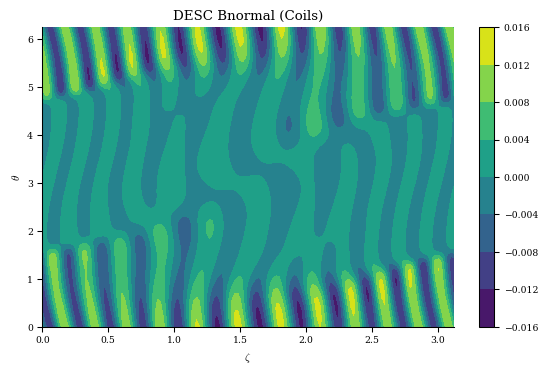

In [13]:
import time

t1 = time.time()
grid = LinearGrid(M=80, N=80, NFP=eq.NFP)
Bn, _ = coilset.compute_Bnormal(eq.surface, eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(
    grid.nodes[grid.unique_zeta_idx, 2],
    grid.nodes[grid.unique_theta_idx, 1],
    Bn.reshape((grid.num_zeta, grid.num_theta)).T,
)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

print(
    f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}"
)

Bn calc took 1.394e+00 seconds
normalized average <Bn> = 0.0035014182502461615


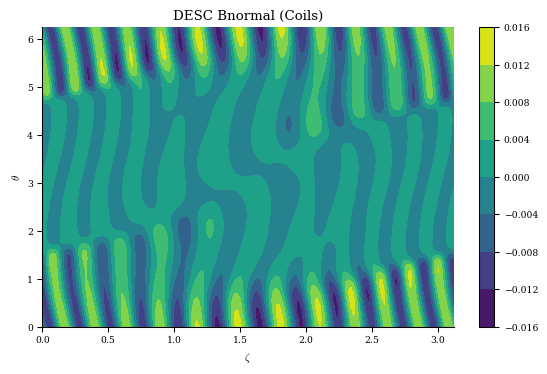

In [14]:
import time

grid = LinearGrid(M=80, N=80, NFP=eq.NFP)
coilset = coilset.to_FourierXYZ(
    N=20
)  # converting to a Fourier series will make the calculations more efficient
t1 = time.time()
Bn, _ = coilset.compute_Bnormal(eq.surface, eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(
    grid.nodes[grid.unique_zeta_idx, 2],
    grid.nodes[grid.unique_theta_idx, 1],
    Bn.reshape((grid.num_zeta, grid.num_theta)).T,
)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

print(
    f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}"
)

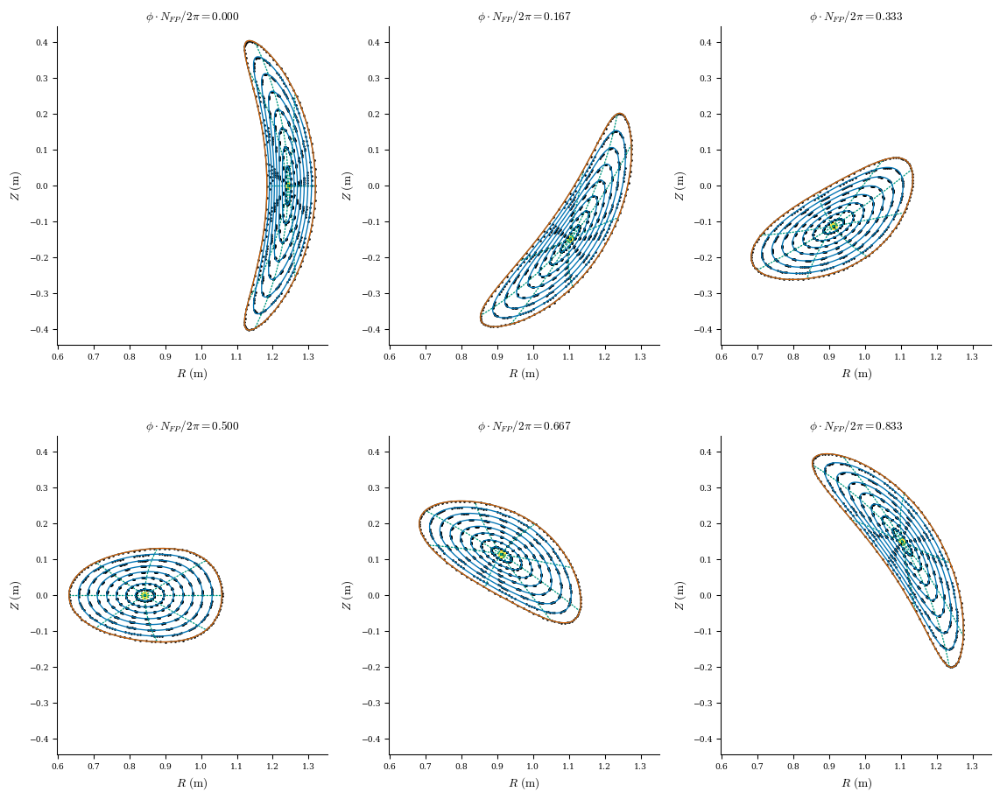

In [15]:
# Field line integration (on a CPU this can about a minute)
plot_field_lines(coilset, eq);

In [16]:
# visualize by plotting coils
fig = plot_3d(
    eq.surface, "B*n", grid=LinearGrid(M=40, N=30, endpoint=True), field=coilset
)
fig = plot_coils(coilset, fig=fig)
fig.show()

### Helical

Helical coil cutting is just as easy as modular, with the same exact function call:

In [17]:
coilset_helical = surface_current_field_helical.to_CoilSet(
    num_coils=16, show_plots=False
)
# num_coils is the total number of coils when the surface current helicity's N_coil and M_coil are nonzero, so we
# will get 16 coils total

Bn calc took 1.599e+00 seconds
normalized average <Bn> = 0.0004788754864232121


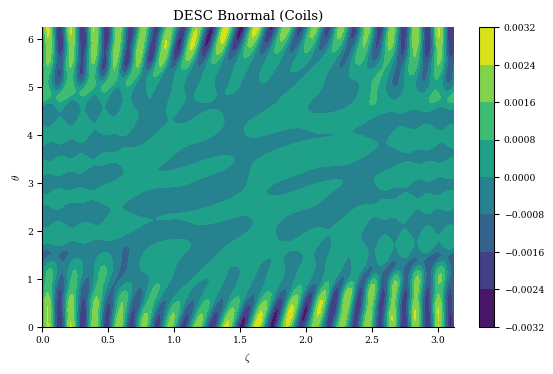

In [18]:
import time

t1 = time.time()
Bn, _ = coilset_helical.compute_Bnormal(eq.surface, eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(
    grid.nodes[grid.unique_zeta_idx, 2],
    grid.nodes[grid.unique_theta_idx, 1],
    Bn.reshape((grid.num_zeta, grid.num_theta)).T,
)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()
print(
    f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}"
)

Bn calc took 8.346e-01 seconds
normalized average <Bn> = 0.000485458119543435


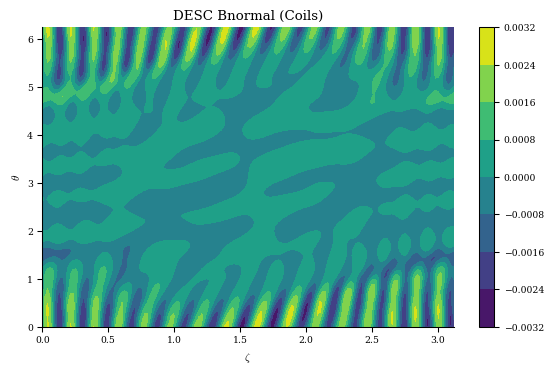

In [19]:
import time

coilset_helical = coilset_helical.to_FourierXYZ(N=30)
t1 = time.time()
Bn, _ = coilset_helical.compute_Bnormal(eq.surface, eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(
    grid.nodes[grid.unique_zeta_idx, 2],
    grid.nodes[grid.unique_theta_idx, 1],
    Bn.reshape((grid.num_zeta, grid.num_theta)).T,
)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()
print(
    f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}"
)

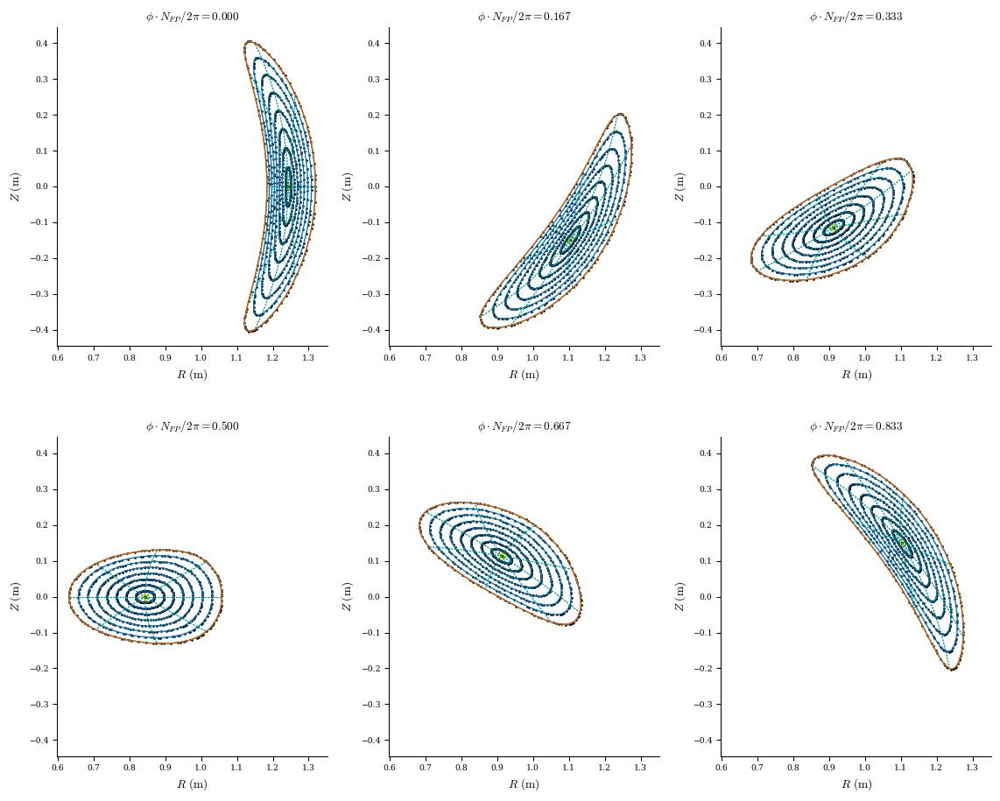

In [20]:
# Field line integration (on a CPU this can take a a minute)
plot_field_lines(coilset_helical, eq);

In [21]:
# visualize by plotting coils
fig = plot_3d(
    eq, "B*n", grid=LinearGrid(M=40, N=30, endpoint=True), field=coilset_helical
)

fig = plot_coils(coilset_helical, fig=fig)
fig.show()

These coils can then be used as the initial guesses for a filamentary coil optimization (see the tutorial on stage two filamentery coil optimization!) to refine the solution and reduce the Bn error further, as well as accounting for engineering tolerances. 